<a href="https://colab.research.google.com/github/TorradoSantiago/ejercicios.regresion/blob/master/TPFINAL_VOTOS_ROSARIO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## TRABAJO FINAL

In [ ]:
!pip install folium geopandas

In [ ]:
# Instalar GeoPandas y otras bibliotecas geoespaciales necesarias
!pip install geopandas
!pip install pyproj
!pip install shapely
!pip install fiona

# Asegurarse de que rtree esté instalado, lo cual es necesario para algunas operaciones espaciales
!sudo apt-get install -y python3-rtree

# Importar las bibliotecas para verificar que todo esté funcionando correctamente
import geopandas as gpd
import pyproj
import shapely
import fiona

# Mostrar las versiones de las bibliotecas para asegurar compatibilidad
print(f"GeoPandas version: {gpd.__version__}")
print(f"Pyproj version: {pyproj.__version__}")
print(f"Shapely version: {shapely.__version__}")
print(f"Fiona version: {fiona.__version__}")


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 75.5 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6
The following NEW packages will be installed:
  libspatialindex-c6 libspatialindex-dev libspatialindex6 python3-rtree
0 upgraded, 4 newly installed, 0 to remove and 49 not upgraded.
Need to get 365 kB of archives.
After this operation, 1,799 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex6 amd64 1.9.3-2 [247 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex-c6 amd64 1.9.3-2 [55.8 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libspatialindex-dev amd64 1.9.3-2 [16.0 kB]
Get:4 http://archive.ubuntu.com/ubuntu jam

In [ ]:
#importamos librerias para graficar
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


##DATOS ROSARIO

In [ ]:
import pandas as pd

# Ruta completa del archivo en tu Google Drive
file_path = '/content/drive/MyDrive/TP_FINAL_OP/Rosario F.xlsx'

# Cargar el archivo XLSX en un DataFrame
df = pd.read_excel(file_path)

# Mostrar las primeras filas del DataFrame
df.head()


,interview__key,METODO,Coord1__Latitude,Coord1__Longitude,EDAD,GENERO,INT DE VOTO X ESPACIO,RADIO
0,56-56-25-81,F2F,-32.881458,-60.695274,56 y mas,Masculino,LIBERTARIOS,820840409
1,67-96-98-06,F2F,-32.882259,-60.693571,36 a 45,Masculino,OTROS,820840410
2,24-21-01-39,F2F,-32.884731,-60.692882,56 y mas,Femenino,OTROS,820840502
3,84-96-80-81,F2F,-32.884673,-60.693464,26 a 35,Masculino,LIBERTARIOS,820840502
4,21-29-79-64,F2F,-32.918833,-60.703628,36 a 45,Femenino,NINGUNO/NOSABE,820841013


In [ ]:
# Información básica del dataframe
print(df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372 entries, 0 to 371
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   interview__key         372 non-null    object 
 1   METODO                 372 non-null    object 
 2   Coord1__Latitude       372 non-null    float64
 3   Coord1__Longitude      372 non-null    float64
 4   EDAD                   372 non-null    object 
 5   GENERO                 372 non-null    object 
 6   INT DE VOTO X ESPACIO  372 non-null    object 
 7   RADIO                  372 non-null    int64  
dtypes: float64(2), int64(1), object(5)
memory usage: 23.4+ KB
None


In [ ]:
# Defining the typical geographic bounds for Rosario, Argentina
lat_min, lat_max = -33.1, -32.8  # Approximate latitude bounds for Rosario
lon_min, lon_max = -60.9, -60.5  # Approximate longitude bounds for Rosario

# Filtering the DataFrame to only include rows within these bounds
df_rosario = df[
    (df['Coord1__Latitude'].between(lat_min, lat_max)) &
    (df['Coord1__Longitude'].between(lon_min, lon_max))
]

# Show the cleaned data and its description to confirm changes
df_rosario.describe(), df_rosario.head()


(       Coord1__Latitude  Coord1__Longitude         RADIO
 count        358.000000         358.000000  3.580000e+02
 mean         -32.947302         -60.677242  8.208455e+08
 std            0.038700           0.035152  8.840736e+04
 min          -33.031098         -60.818696  8.202803e+08
 25%          -32.964252         -60.698654  8.208418e+08
 50%          -32.950609         -60.678748  8.208433e+08
 75%          -32.926624         -60.645256  8.208454e+08
 max          -32.812803         -60.619427  8.211909e+08,
   interview__key METODO  Coord1__Latitude  Coord1__Longitude      EDAD  \
 0    56-56-25-81    F2F        -32.881458         -60.695274  56 y mas   
 1    67-96-98-06    F2F        -32.882259         -60.693571   36 a 45   
 2    24-21-01-39    F2F        -32.884731         -60.692882  56 y mas   
 3    84-96-80-81    F2F        -32.884673         -60.693464   26 a 35   
 4    21-29-79-64    F2F        -32.918833         -60.703628   36 a 45   
 
       GENERO INT DE VOTO

In [ ]:
# Mostrar las columnas del DataFrame
print(df_rosario.columns)

# Eliminar espacios en los nombres de columnas
df_rosario.columns = df_rosario.columns.str.strip()

# Verifica nuevamente las columnas
print(df_rosario.columns)

Index(['interview__key', 'METODO', 'Coord1__Latitude', 'Coord1__Longitude',
       'EDAD', 'GENERO', 'INT DE VOTO X ESPACIO', 'RADIO'],
      dtype='object')
Index(['interview__key', 'METODO', 'Coord1__Latitude', 'Coord1__Longitude',
       'EDAD', 'GENERO', 'INT DE VOTO X ESPACIO', 'RADIO'],
      dtype='object')


##MAPA ARGENTINA

In [ ]:
# Probar cargar un archivo shapefile para asegurar que todo funciona
gpd.read_file('/content/drive/MyDrive/TP_FINAL_OP/departamentos.zip').head()  # Asegúrate de subir tu shapefile a Colab antes de ejecutar

,id,nombre,nombre_com,provincia,fuente,categoria,centroide,geometry
0,06014,Adolfo Gonzales Chaves,Partido de Adolfo Gonzales Chaves,"{ ""id"": ""06"", ""nombre"": ""Buenos Aires"", ""inter...",IGN,Partido,"{ ""lon"": -60.248282, ""lat"": -37.964616 }","POLYGON ((-60.3334 -37.76862, -60.32344 -37.77..."
1,30015,Concordia,Departamento Concordia,"{ ""id"": ""30"", ""nombre"": ""Entre Ríos"", ""interse...",IGN,Departamento,"{ ""lon"": -58.237870, ""lat"": -31.290298 }","POLYGON ((-58.38761 -30.82889, -58.24992 -30.8..."
2,30035,Federal,Departamento Federal,"{ ""id"": ""30"", ""nombre"": ""Entre Ríos"", ""interse...",IGN,Departamento,"{ ""lon"": -58.891860, ""lat"": -30.992427 }","POLYGON ((-58.96265 -30.60344, -58.91479 -30.6..."
3,30056,Gualeguaychú,Departamento Gualeguaychú,"{ ""id"": ""30"", ""nombre"": ""Entre Ríos"", ""interse...",IGN,Departamento,"{ ""lon"": -58.785805, ""lat"": -33.022349 }","POLYGON ((-59.06547 -32.48629, -58.97047 -32.5..."
4,30063,Islas del Ibicuy,Departamento Islas del Ibicuy,"{ ""id"": ""30"", ""nombre"": ""Entre Ríos"", ""interse...",IGN,Departamento,"{ ""lon"": -58.933896, ""lat"": -33.624996 }","POLYGON ((-58.43841 -33.51761, -58.44501 -33.5..."


<Axes: >

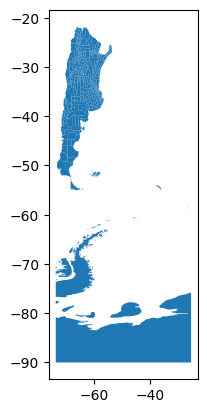

In [ ]:
import geopandas as gpd

# Ruta al archivo ZIP en Google Drive
zip_path = '/content/drive/MyDrive/TP_FINAL_OP/departamentos.zip'

# Leer el shapefile directamente desde el ZIP
mapa_argentina = gpd.read_file(f"zip://{zip_path}")

# Mostrar el mapa básico
mapa_argentina.plot()


In [ ]:
# Inspeccionar el GeoDataFrame
mapa_argentina.head()
mapa_argentina.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 529 entries, 0 to 528
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   id          529 non-null    object  
 1   nombre      529 non-null    object  
 2   nombre_com  529 non-null    object  
 3   provincia   529 non-null    object  
 4   fuente      529 non-null    object  
 5   categoria   529 non-null    object  
 6   centroide   529 non-null    object  
 7   geometry    529 non-null    geometry
dtypes: geometry(1), object(7)
memory usage: 33.2+ KB


In [ ]:
!pip install geopandas shapely

from shapely.geometry import Point

# Leer el shapefile desde Google Drive (reemplaza con la ruta real)
shp_path = '/content/drive/MyDrive/TP_FINAL_OP/departamentos.zip'
mapa_argentina = gpd.read_file(shp_path)

# Verificar los datos
print(mapa_argentina.head())


      id                  nombre                         nombre_com  \
0  06014  Adolfo Gonzales Chaves  Partido de Adolfo Gonzales Chaves   
1  30015               Concordia             Departamento Concordia   
2  30035                 Federal               Departamento Federal   
3  30056            Gualeguaychú          Departamento Gualeguaychú   
4  30063        Islas del Ibicuy      Departamento Islas del Ibicuy   

                                           provincia fuente     categoria  \
0  { "id": "06", "nombre": "Buenos Aires", "inter...    IGN       Partido   
1  { "id": "30", "nombre": "Entre Ríos", "interse...    IGN  Departamento   
2  { "id": "30", "nombre": "Entre Ríos", "interse...    IGN  Departamento   
3  { "id": "30", "nombre": "Entre Ríos", "interse...    IGN  Departamento   
4  { "id": "30", "nombre": "Entre Ríos", "interse...    IGN  Departamento   

                                  centroide  \
0  { "lon": -60.248282, "lat": -37.964616 }   
1  { "lon": -58.

## YUXTAPOSICION

In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point

# Crear una geometría (puntos) a partir de las columnas de latitud y longitud
geometry = [Point(xy) for xy in zip(df_rosario['Coord1__Longitude'], df_rosario['Coord1__Latitude'])]  # Reemplaza con los nombres reales de las columnas
geo_df = gpd.GeoDataFrame(df_rosario, geometry=geometry)

# Asegurarte de que ambos GeoDataFrames tienen el mismo sistema de coordenadas
geo_df.crs = mapa_argentina.crs

In [ ]:
# Verifica las primeras filas de las columnas de longitud y latitud
print(df_rosario[['Coord1__Longitude', 'Coord1__Latitude']].head())


   Coord1__Longitude  Coord1__Latitude
0         -60.695274        -32.881458
1         -60.693571        -32.882259
2         -60.692882        -32.884731
3         -60.693464        -32.884673
4         -60.703628        -32.918833


In [ ]:
# Cruce espacial entre puntos y el shapefile
puntos_con_departamentos = gpd.sjoin(geo_df, mapa_argentina, how="inner", predicate='intersects')

# Verificar resultados
print(puntos_con_departamentos.head())


  interview__key METODO  Coord1__Latitude  Coord1__Longitude      EDAD  \
0    56-56-25-81    F2F        -32.881458         -60.695274  56 y mas   
1    67-96-98-06    F2F        -32.882259         -60.693571   36 a 45   
2    24-21-01-39    F2F        -32.884731         -60.692882  56 y mas   
3    84-96-80-81    F2F        -32.884673         -60.693464   26 a 35   
4    21-29-79-64    F2F        -32.918833         -60.703628   36 a 45   

      GENERO INT DE VOTO X ESPACIO      RADIO                     geometry  \
0  Masculino           LIBERTARIOS  820840409  POINT (-60.69527 -32.88146)   
1  Masculino                 OTROS  820840410  POINT (-60.69357 -32.88226)   
2   Femenino                 OTROS  820840502  POINT (-60.69288 -32.88473)   
3  Masculino           LIBERTARIOS  820840502  POINT (-60.69346 -32.88467)   
4   Femenino        NINGUNO/NOSABE  820841013  POINT (-60.70363 -32.91883)   

   index_right     id   nombre            nombre_com  \
0          397  82084  Rosario

In [ ]:
print(geo_df.crs)  # Sistema de coordenadas de los puntos
print(mapa_argentina.crs)  # Sistema de coordenadas del shapefile


EPSG:4326
EPSG:4326


In [ ]:
geo_df.crs = "EPSG:4326"
mapa_argentina.crs = "EPSG:4326"



In [ ]:
print(geo_df.crs)
print(mapa_argentina.crs)


EPSG:4326
EPSG:4326


In [ ]:
puntos_con_departamentos = gpd.sjoin(geo_df, mapa_argentina, how="inner", predicate="intersects")

# Verificar resultados
print(puntos_con_departamentos.head())


  interview__key METODO  Coord1__Latitude  Coord1__Longitude      EDAD  \
0    56-56-25-81    F2F        -32.881458         -60.695274  56 y mas   
1    67-96-98-06    F2F        -32.882259         -60.693571   36 a 45   
2    24-21-01-39    F2F        -32.884731         -60.692882  56 y mas   
3    84-96-80-81    F2F        -32.884673         -60.693464   26 a 35   
4    21-29-79-64    F2F        -32.918833         -60.703628   36 a 45   

      GENERO INT DE VOTO X ESPACIO      RADIO                     geometry  \
0  Masculino           LIBERTARIOS  820840409  POINT (-60.69527 -32.88146)   
1  Masculino                 OTROS  820840410  POINT (-60.69357 -32.88226)   
2   Femenino                 OTROS  820840502  POINT (-60.69288 -32.88473)   
3  Masculino           LIBERTARIOS  820840502  POINT (-60.69346 -32.88467)   
4   Femenino        NINGUNO/NOSABE  820841013  POINT (-60.70363 -32.91883)   

   index_right     id   nombre            nombre_com  \
0          397  82084  Rosario

In [ ]:
# Filtrar datos donde el partido político está en el diccionario
puntos_filtrados = puntos_con_departamentos[puntos_con_departamentos['INT DE VOTO X ESPACIO'].isin(colores_partidos.keys())]

# Crear un mapa base centrado en Rosario, Argentina
m = folium.Map(location=[-32.95, -60.66], zoom_start=10)

# Agregar los puntos al mapa con colores según el partido político

colores_partidos = {
    'LIBERTARIOS': 'blue',
    'OTROS': 'green',
    'NINGUNO/NOSABE': 'gray',
    'FdT': 'red',
    'JxC': 'yellow',
    'FIT': 'purple',  # Color para el partido FIT
    'PNK': 'pink'      # Color para el partido PNK
}

for _, row in puntos_filtrados.iterrows():
    partido = row['INT DE VOTO X ESPACIO']  # Columna del partido político
    color = colores_partidos.get(partido, 'black')  # Obtener el color asignado

    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],  # Coordenadas de cada punto
        radius=5,  # Tamaño del marcador
        color=color,  # Color del borde
        fill=True,
        fill_color=color,  # Color de relleno
        fill_opacity=0.7,  # Transparencia
        popup=f"Partido: {partido}"  # Información adicional
    ).add_to(m)

from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}
<div style='position: fixed;
            bottom: 50px; left: 50px; width: 200px; height: auto;
            background: rgba(0,0,0,0.6); border:2px solid rgba(255,255,255,0.8);
            border-radius: 8px; padding: 10px; z-index:9999; font-size:14px; color: white;
            '>
    &nbsp; Colores de Partidos <br>
    &nbsp; FIT &nbsp; <i class="fa fa-circle fa-1x" style="color:purple"></i><br>
    &nbsp; PNK &nbsp; <i class="fa fa-circle fa-1x" style="color:pink"></i><br>
    &nbsp; JxC &nbsp; <i class="fa fa-circle fa-1x" style="color:yellow"></i><br>
    &nbsp; FdT &nbsp; <i class="fa fa-circle fa-1x" style="color:red"></i><br>
    &nbsp; LIBERTARIOS &nbsp; <i class="fa fa-circle fa-1x" style="color:blue"></i><br>
    &nbsp; OTROS &nbsp; <i class="fa fa-circle fa-1x" style="color:green"></i><br>
    &nbsp; NINGUNO/NOSABE &nbsp; <i class="fa fa-circle fa-1x" style="color:gray"></i><br>
</div>
{% endmacro %}
"""


macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Mostrar el mapa
m


In [ ]:
# Guardar el mapa en un archivo HTML
m.save('mapa_interactivo.html')

# Descargar el archivo (si lo necesitas en tu computadora)
from google.colab import files
files.download('mapa_interactivo.html')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## AGREGANDO VULNERABILIDAD SANITARIA

In [ ]:
# Ruta del archivo ZIP
zip_path = "/content/drive/MyDrive/TP_FINAL_OP/Vulnerabilidad sanitaria 2010-2018 - Gran Rosario.zip"

# Leer el shapefile directamente desde el archivo ZIP
vulnerabilidad = gpd.read_file(f"zip://{zip_path}")

# Inspeccionar el contenido
print(vulnerabilidad.head())

       RADIO  VULNERABIL       NSE CENTRO_DE_            HOSPITAL POSTA_SANI  \
0  821190119    0.715334 -0.314643      38.67              31.278         NA   
1  821190121    0.740758 -0.303224     42.156              45.118         NA   
2  821190104    0.519391 -0.110779     24.378              16.284         NA   
3  821190120    0.481331  0.043942       28.1  20.041999999999998         NA   
4  821190118    0.701878 -0.265881      35.06              38.726         NA   

  IDPROV      PROV IDDPTO         DPTO    REDCODE  RADIOS_POB  RADIOS_HOG  \
0     82  Santa Fe  82119  San Lorenzo  821190119        1254         328   
1     82  Santa Fe  82119  San Lorenzo  821190121        2240         563   
2     82  Santa Fe  82119  San Lorenzo  821190104         840         264   
3     82  Santa Fe  82119  San Lorenzo  821190120        3893         974   
4     82  Santa Fe  82119  San Lorenzo  821190118         898         248   

   RADIOS_LAT  RADIOS_LON  RADIOS_SUP  \
0  -32.696597  

In [ ]:
# Verificar el CRS del nuevo shapefile
print(vulnerabilidad.crs)

# Asignar el CRS si es necesario (usualmente WGS 84: EPSG:4326)
if vulnerabilidad.crs is None:
    vulnerabilidad.crs = "EPSG:4326"

# Convertir al CRS de los otros mapas si es diferente
vulnerabilidad = vulnerabilidad.to_crs("EPSG:4326")


EPSG:4326


In [ ]:
# Ver las columnas del GeoDataFrame
print(vulnerabilidad.columns)


Index(['RADIO', 'VULNERABIL', 'NSE', 'CENTRO_DE_', 'HOSPITAL', 'POSTA_SANI',
       'IDPROV', 'PROV', 'IDDPTO', 'DPTO', 'REDCODE', 'RADIOS_POB',
       'RADIOS_HOG', 'RADIOS_LAT', 'RADIOS_LON', 'RADIOS_SUP', 'geometry'],
      dtype='object')


mas codigo

In [ ]:
import folium
from folium import CircleMarker
from branca.element import Template, MacroElement
from matplotlib import cm
from matplotlib.colors import to_hex, Normalize

# Datos filtrados donde el partido político está en el diccionario
puntos_filtrados = puntos_con_departamentos[puntos_con_departamentos['INT DE VOTO X ESPACIO'].isin(colores_partidos.keys())]

# Crear un mapa base centrado en Rosario, Argentina
m = folium.Map(location=[-32.95, -60.66], zoom_start=10)


# Normalizar los valores de vulnerabilidad
norm = Normalize(vmin=vulnerabilidad['VULNERABIL'].min(), vmax=vulnerabilidad['VULNERABIL'].max())

# Elegir una paleta de colores (ejemplo: 'Oranges')
palette = cm.get_cmap('Oranges')

# Agregar cada departamento con color basado en el nivel de vulnerabilidad
for _, row in vulnerabilidad.iterrows():
    color = to_hex(palette(norm(row['VULNERABIL'])))

    folium.GeoJson(
        data=row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7,
        }
    ).add_to(m)

# Colores asignados a cada partido político
colores_partidos = {
    'LIBERTARIOS': 'blue',
    'OTROS': 'green',
    'NINGUNO/NOSABE': 'gray',
    'FdT': 'red',
    'JxC': 'yellow',
    'FIT': 'purple',
    'PNK': 'pink'
}

# Agregar los puntos al mapa con colores según el partido político
for _, row in puntos_filtrados.iterrows():
    partido = row['INT DE VOTO X ESPACIO']
    color = colores_partidos.get(partido, 'black')

    CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Partido: {partido}"
    ).add_to(m)

# Template para la leyenda de colores de partidos políticos y vulnerabilidad
template = """
{% macro html(this, kwargs) %}
<div style='position: fixed;
            bottom: 50px; left: 50px; width: 200px; height: auto;
            background: rgba(0,0,0,0.6); border:2px solid rgba(255,255,255,0.8);
            border-radius: 8px; padding: 10px; z-index:9999; font-size:14px; color: white;
            '>
    &nbsp; Colores de Partidos <br>
    &nbsp; FIT &nbsp; <i class="fa fa-circle fa-1x" style="color:purple"></i><br>
    &nbsp; PNK &nbsp; <i class="fa fa-circle fa-1x" style="color:pink"></i><br>
    &nbsp; JxC &nbsp; <i class="fa fa-circle fa-1x" style="color:yellow"></i><br>
    &nbsp; FdT &nbsp; <i class="fa fa-circle fa-1x" style="color:red"></i><br>
    &nbsp; LIBERTARIOS &nbsp; <i class="fa fa-circle fa-1x" style="color:blue"></i><br>
    &nbsp; OTROS &nbsp; <i class="fa fa-circle fa-1x" style="color:green"></i><br>
    &nbsp; NINGUNO/NOSABE &nbsp; <i class="fa fa-circle fa-1x" style="color:gray"></i><br>
    <br>
    &nbsp; Vulnerabilidad Sanitaria<br>
    &nbsp; <span style="color:#fff5eb;">&#9679;</span> Baja<br>
    &nbsp; <span style="color:#fdae6b;">&#9679;</span> Media<br>
    &nbsp; <span style="color:#e6550d;">&#9679;</span> Alta<br>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Mostrar el mapa
m


<ipython-input-59-febf3328aae0>:18: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('Oranges')


In [ ]:
import folium
from matplotlib import cm
from matplotlib.colors import to_hex, Normalize

# Crear un mapa base
m = folium.Map(location=[-32.95, -60.66], zoom_start=10)

# Agregar los puntos al mapa con colores según el partido político

colores_partidos = {
    'LIBERTARIOS': 'blue',
    'OTROS': 'green',
    'NINGUNO/NOSABE': 'gray',
    'FJF': 'red',
    'JxC': 'yellow',
    'FIT': 'purple',  # Color para el partido FIT
    'PNK': 'pink'      # Color para el partido PNK
}

# 1. Aplicar un degradado a los departamentos según vulnerabilidad sanitaria
# Normalizar los valores de vulnerabilidad
norm = Normalize(vmin=vulnerabilidad['VULNERABIL'].min(),
                 vmax=vulnerabilidad['VULNERABIL'].max())

# Elegir una paleta de colores (ejemplo: 'Oranges')
palette = cm.get_cmap('Oranges')

# Agregar cada departamento con color basado en el nivel de vulnerabilidad
for _, row in vulnerabilidad.iterrows():
    color = to_hex(palette(norm(row['VULNERABIL'])))

    folium.GeoJson(
        data=row['geometry'].__geo_interface__,  # Convertir a GeoJSON
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7,
        }
    ).add_to(m)

# 2. Agregar los puntos de partidos políticos
for _, row in puntos_filtrados.iterrows():
    partido = row['INT DE VOTO X ESPACIO']
    color = colores_partidos[partido]

    # Usar CircleMarker sin el círculo blanco
    folium.CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Partido: {partido}"
    ).add_to(m)

# 3. Agregar leyenda para vulnerabilidad sanitaria (opcional)
legend_html = '''
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 250px; height: 150px;
            background-color: white; z-index:9999; font-size:14px;
            border:2px solid grey; padding: 10px;">
<b>Vulnerabilidad Sanitaria</b><br>
<span style="color:#fff5eb;">&#9679;</span> Baja<br>
<span style="color:#fdae6b;">&#9679;</span> Media<br>
<span style="color:#e6550d;">&#9679;</span> Alta<br>
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# 4. Agregar leyenda para partidos políticos
template = """
{% macro html(this, kwargs) %}
<div style='position: fixed;
            bottom: 50px; left: 50px; width: 200px; height: auto;
            background: rgba(0,0,0,0.6); border:2px solid rgba(255,255,255,0.8);
            border-radius: 8px; padding: 10px; z-index:9999; font-size:14px; color: white;
            '>
    &nbsp; Colores de Partidos <br>
    &nbsp; FIT &nbsp; <i class="fa fa-circle fa-1x" style="color:purple"></i><br>
    &nbsp; PNK &nbsp; <i class="fa fa-circle fa-1x" style="color:pink"></i><br>
    &nbsp; JxC &nbsp; <i class="fa fa-circle fa-1x" style="color:yellow"></i><br>
    &nbsp; FJF &nbsp; <i class="fa fa-circle fa-1x" style="color:red"></i><br>
    &nbsp; LIBERTARIOS &nbsp; <i class="fa fa-circle fa-1x" style="color:blue"></i><br>
    &nbsp; OTROS &nbsp; <i class="fa fa-circle fa-1x" style="color:green"></i><br>
    &nbsp; NINGUNO/NOSABE &nbsp; <i class="fa fa-circle fa-1x" style="color:gray"></i><br>
</div>
{% endmacro %}
"""
m.get_root().html.add_child(folium.Element(legend_partidos))

# Mostrar el mapa
m



<ipython-input-48-7fb6e2ad1766>:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('Oranges')


dataset educativo

In [ ]:
# Ruta del archivo ZIP
zip_path = "/content/drive/MyDrive/TP_FINAL_OP/Indicadores de personas. Radios, 2022 - Gran Rosario.zip"

# Leer el shapefile directamente desde el archivo ZIP
indice_educacion = gpd.read_file(f"zip://{zip_path}")

# Inspeccionar el contenido
print(indice_educacion.head())

# Verificar el CRS del nuevo shapefile
print(indice_educacion.crs)

     REDCODE  P_TOTAL  P_A17  P_0A3  P_4A5  P_6A12  P_13A17  P_18A  P_18A29  \
0  820840216    682.0  182.0   35.0   17.0    78.0     52.0  500.0    113.0   
1  820840218   1232.0  373.0   71.0   39.0   153.0    110.0  859.0    258.0   
2  820840221   1017.0  248.0   37.0   28.0    97.0     86.0  769.0    200.0   
3  820840222    794.0  198.0   45.0   13.0    79.0     61.0  596.0    144.0   
4  820840301    805.0  304.0   65.0   45.0   127.0     67.0  501.0    170.0   

   P_30A54  ...  CODDPTO     DPTO  REDCODE_1  RADIO  RADIOS_POB  RADIOS_HOG  \
0    218.0  ...    82084  Rosario  820840216   None         682         224   
1    432.0  ...    82084  Rosario  820840218   None        1232         365   
2    361.0  ...    82084  Rosario  820840221   None        1017         352   
3    290.0  ...    82084  Rosario  820840222   None         794         271   
4    263.0  ...    82084  Rosario  820840301   None         805         267   

   RADIOS_LAT  RADIOS_LON  RADIOS_SUP  \
0  -32.83

In [ ]:
# Asignar el CRS si es necesario (usualmente WGS 84: EPSG:4326)
if indice_educacion.crs is None:
    indice_educacion.crs = "EPSG:4326"

# Convertir al CRS de los otros mapas si es diferente
indice_educacion = indice_educacion.to_crs("EPSG:4326")

# Ver las columnas del GeoDataFrame
print(indice_educacion.columns)


Index(['REDCODE', 'P_TOTAL', 'P_A17', 'P_0A3', 'P_4A5', 'P_6A12', 'P_13A17',
       'P_18A', 'P_18A29', 'P_30A54', 'P_55A69', 'P_70A', 'M_TOTAL', 'M_A17',
       'M_0A3', 'M_4A5', 'M_6A12', 'M_13A17', 'M_18A', 'M_18A29', 'M_30A54',
       'M_55A69', 'M_70A', 'V_TOTAL', 'V_A17', 'V_0A3', 'V_4A5', 'V_6A12',
       'V_13A17', 'V_18A', 'V_18A29', 'V_30A54', 'V_55A69', 'V_70A',
       'P18A_SIN_I', 'P18A_PRIMA', 'P18A_SECUN', 'P18A_SOLOP', 'P18A_SOLOS',
       'P18A_TERCI', 'P18A_UNIVE', 'P0A3_ASIST', 'P4A5_ASIST', 'P6A12_ASIS',
       'P1317_ASIS', 'P1317_SIN_', 'P1829_ASIS', 'P1829_SIN_', 'P1425_ASIS',
       'P1425_SIN_', 'P1425', 'P_COBERTUR', 'P_COBERT_1', 'P_COBERT_2',
       'P65_JUBILA', 'P65_PENSIO', 'P65_JUBI_1', 'P_PENSION_', 'P65_TOTAL',
       'CODPROV', 'PROV', 'CODDPTO', 'DPTO', 'REDCODE_1', 'RADIO',
       'RADIOS_POB', 'RADIOS_HOG', 'RADIOS_LAT', 'RADIOS_LON', 'RADIOS_SUP',
       'geometry'],
      dtype='object')


poblacion mayor a 18 con primaria completa sin secundario completo

In [ ]:
import folium
from folium import CircleMarker
from branca.element import Template, MacroElement
from matplotlib import cm
from matplotlib.colors import to_hex, Normalize

# Datos filtrados donde el partido político está en el diccionario
puntos_filtrados = puntos_con_departamentos[puntos_con_departamentos['INT DE VOTO X ESPACIO'].isin(colores_partidos.keys())]

# Crear un mapa base centrado en Rosario, Argentina
m = folium.Map(location=[-32.95, -60.66], zoom_start=10)

# Normalizar los valores de índice de educación
norm = Normalize(vmin=0, vmax=100)  # Normalizar entre 0% y 100%

# Elegir una paleta de colores (Oranges para un degradado suave)
palette = cm.get_cmap('Oranges')

# Agregar cada radio censal con color basado en el nivel de educación
for _, row in indice_educacion.iterrows():
    # Asumiendo 'P18A_SOLOP' representa la proporción de educación correspondiente
    percentage = row['P18A_SOLOP']  # Aquí debes asegurarte de usar la columna correcta para el porcentaje
    color = to_hex(palette(norm(percentage)))

    folium.GeoJson(
        data=row['geometry'].__geo_interface__,
        style_function=lambda feature, color=color: {
            'fillColor': color,
            'color': 'black',
            'weight': 1,
            'fillOpacity': 0.7,
        }
    ).add_to(m)

# Agregar los puntos al mapa con colores según el partido político
for _, row in puntos_filtrados.iterrows():
    partido = row['INT DE VOTO X ESPACIO']
    color = colores_partidos.get(partido, 'black')

    CircleMarker(
        location=[row.geometry.y, row.geometry.x],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=f"Partido: {partido}"
    ).add_to(m)

# Template para la leyenda de colores de partidos políticos y nivel educativo
template = """
{% macro html(this, kwargs) %}
<div style='position: fixed;
            bottom: 50px; left: 50px; width: 300px; height: auto;
            background: rgba(0,0,0,0.6); border:2px solid rgba(255,255,255,0.8);
            border-radius: 8px; padding: 10px; z-index:9999; font-size:14px; color: white;
            '>
    &nbsp; Colores de Partidos <br>
    &nbsp; FIT &nbsp; <i class="fa fa-circle fa-1x" style="color:purple"></i><br>
    &nbsp; PNK &nbsp; <i class="fa fa-circle fa-1x" style="color:pink"></i><br>
    &nbsp; JxC &nbsp; <i class="fa fa-circle fa-1x" style="color:yellow"></i><br>
    &nbsp; FdT &nbsp; <i class="fa fa-circle fa-1x" style="color:red"></i><br>
    &nbsp; LIBERTARIOS &nbsp; <i class="fa fa-circle fa-1x" style="color:blue"></i><br>
    &nbsp; OTROS &nbsp; <i class="fa fa-circle fa-1x" style="color:green"></i><br>
    &nbsp; NINGUNO/NOSABE &nbsp; <i class="fa fa-circle fa-1x" style="color:gray"></i><br>
    <br>
    &nbsp; Nivel Educativo<br>
    &nbsp; <span style="color:#fff5eb;">&#9679;</span> Menor que 25%<br>
    &nbsp; <span style="color:#fee6ce;">&#9679;</span> 25 a 40%<br>
    &nbsp; <span style="color:#fdae6b;">&#9679;</span> 40 a 55%<br>
    &nbsp; <span style="color:#e6550d;">&#9679;</span> 55% y más<br>
</div>
{% endmacro %}
"""

macro = MacroElement()
macro._template = Template(template)

m.get_root().add_child(macro)

# Mostrar el mapa
m


<ipython-input-76-d625a87c4a3d>:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  palette = cm.get_cmap('Oranges')


## REGRESION LOGISTICA

In [ ]:
# Cargar el archivo de Excel recientemente subido para verificar su contenido y estructura
excel_path_new = '/content/drive/MyDrive/TP_FINAL_OP/Rosario F.xlsx'
try:
    df_votacion_nueva = pd.read_excel(excel_path_new)
    votacion_nueva_info = df_votacion_nueva.head()
    votacion_nueva_columns = df_votacion_nueva.columns
except Exception as e:
    votacion_nueva_error = str(e)

votacion_nueva_info, votacion_nueva_columns, votacion_nueva_error if "votacion_nueva_error" in locals() else "No error"


In [ ]:
# Crear una columna binaria para la intención de voto a "LIBERTARIOS"
df_votacion_nueva['Voto_LIBERTARIOS'] = (df_votacion_nueva['INT DE VOTO X ESPACIO'] == "LIBERTARIOS").astype(int)

# Agrupar por radio censal y calcular el porcentaje de votos a "LIBERTARIOS" en cada radio
voto_por_radio = df_votacion_nueva.groupby('RADIO')['Voto_LIBERTARIOS'].mean().reset_index()

# Cargar el shapefile para obtener los datos del nivel educativo
shapefile_path = '/content/drive/MyDrive/TP_FINAL_OP/Indicadores de personas. Radios, 2022 - Gran Rosario.zip'
educacion_gdf = gpd.read_file(shapefile_path)

# Extraer solo las columnas necesarias: RADIO (como integer para asegurar correspondencia) y P18A_SOLOP (asumiendo representa nivel educativo)
educacion_gdf['RADIO'] = educacion_gdf['REDCODE'].astype(int)
educacion_gdf = educacion_gdf[['RADIO', 'P18A_SOLOP']]

# Combinar los datos de votación con los de educación
datos_combinados = pd.merge(voto_por_radio, educacion_gdf, on='RADIO', how='inner')

# Verificar el DataFrame combinado
datos_combinados.head(), datos_combinados.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 224 entries, 0 to 223
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   RADIO             224 non-null    int64  
 1   Voto_LIBERTARIOS  224 non-null    float64
 2   P18A_SOLOP        224 non-null    int32  
dtypes: float64(1), int32(1), int64(1)
memory usage: 4.5 KB


(       RADIO  Voto_LIBERTARIOS  P18A_SOLOP
 0  820840305               0.0         193
 1  820840307               0.5          43
 2  820840311               0.0         353
 3  820840402               1.0         168
 4  820840408               0.0         184,
 None)

In [ ]:
# Intentar cargar el shapefile nuevamente sin incluir la geometría para evitar errores
try:
    educacion_gdf = gpd.read_file(shapefile_path, ignore_geometry=True)
    educacion_gdf['RADIO'] = educacion_gdf['REDCODE'].astype(int)  # Convertir a entero para asegurar la correspondencia
    educacion_gdf = educacion_gdf[['RADIO', 'P18A_SOLOP']]  # Asumiendo P18A_SOLOP es el porcentaje relevante de nivel educativo
except Exception as e:
    load_error = str(e)

# Intentar nuevamente combinar los datos de votación con los de educación
try:
    datos_combinados = pd.merge(voto_por_radio, educacion_gdf, on='RADIO', how='inner')
    combined_info = datos_combinados.head()
    combined_columns = datos_combinados.columns
    combined_describe = datos_combinados.describe()
except Exception as e:
    merge_error = str(e)

combined_info, combined_columns, combined_describe, load_error if "load_error" in locals() else "No error", merge_error if "merge_error" in locals() else "No error"


(       RADIO  Voto_LIBERTARIOS  P18A_SOLOP
 0  820840305               0.0         193
 1  820840307               0.5          43
 2  820840311               0.0         353
 3  820840402               1.0         168
 4  820840408               0.0         184,
 Index(['RADIO', 'Voto_LIBERTARIOS', 'P18A_SOLOP'], dtype='object'),
               RADIO  Voto_LIBERTARIOS  P18A_SOLOP
 count  2.240000e+02        224.000000  224.000000
 mean   8.208603e+08          0.165327  133.330357
 std    7.525823e+04          0.341278  112.216590
 min    8.208403e+08          0.000000    9.000000
 25%    8.208417e+08          0.000000   40.750000
 50%    8.208429e+08          0.000000   96.500000
 75%    8.208449e+08          0.000000  194.500000
 max    8.211910e+08          1.000000  467.000000,
 'REDCODE  P_TOTAL  P_A17  P_0A3  P_4A5  P_6A12  P_13A17  P_18A  \\0     820840216    682.0  182.0   35.0   17.0    78.0     52.0  500.0   1     820840218   1232.0  373.0   71.0   39.0   153.0    110.0  859

In [ ]:
from sklearn.linear_model import LogisticRegression
import numpy as np

# Convertir la columna 'Voto_LIBERTARIOS' en binaria
datos_combinados['Voto_LIBERTARIOS_bin'] = (datos_combinados['Voto_LIBERTARIOS'] > 0).astype(int)

# Verificar los valores únicos de la nueva columna binaria
unique_values_bin = datos_combinados['Voto_LIBERTARIOS_bin'].value_counts()

# Preparar los datos con la columna binaria
X_bin = datos_combinados[['P18A_SOLOP']]  # Variable independiente: nivel educativo
y_bin = datos_combinados['Voto_LIBERTARIOS_bin']  # Variable dependiente: voto a "Libertarios" binario

# Crear y entrenar el modelo de regresión logística con la variable binaria
model_bin = LogisticRegression()
model_bin.fit(X_bin, y_bin)

# Coeficientes del modelo con variable binaria
coef_intercept_bin = model_bin.intercept_[0]
coef_slope_bin = model_bin.coef_[0][0]

unique_values_bin, coef_intercept_bin, coef_slope_bin


(Voto_LIBERTARIOS_bin
 0    174
 1     50
 Name: count, dtype: int64,
 -1.509015834194117,
 0.001874685139776237)

El modelo de regresión logística se ajustó correctamente con los siguientes coeficientes:

Intercepto (coef_intercept_bin): -1.5090
Pendiente (coef_slope_bin): 0.00187
Estos coeficientes indican que existe una relación entre el nivel educativo y la probabilidad de votar por "Libertarios". El signo positivo de la pendiente sugiere que a medida que aumenta el nivel educativo (representado por P18A_SOLOP), también aumenta ligeramente la probabilidad de votar por "Libertarios".

La relación positiva que encontramos en la regresión logística, donde la pendiente es positiva, efectivamente sugiere que a medida que aumenta el porcentaje de personas con educación primaria completa pero sin secundario completo (es decir, menor nivel educativo formal), aumenta la probabilidad de votar por "Libertarios". Esto significa que en áreas con menor nivel educativo formal, hay una tendencia más alta hacia el voto a "Libertarios".

Este hallazgo puede ser útil para entender mejor el perfil demográfico y educativo del apoyo a "Libertarios" en Rosario. Si deseas explorar más sobre cómo otras variables pueden influir en la intención de voto, o si necesitas realizar análisis estadísticos adicionales para confirmar estos resultados, estaré encantado de ayudarte con eso.

In [ ]:
import numpy as np

# Coeficiente obtenido de la regresión logística
coeficiente = coef_slope_bin

# Calcular el Odds Ratio
odds_ratio = np.exp(coeficiente)

print("Odds Ratio:", odds_ratio)


Odds Ratio: 1.0018764434605572


## regresion universitarios

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

# Cargar y preparar los datos
shapefile_path = '/content/drive/MyDrive/TP_FINAL_OP/Indicadores de personas. Radios, 2022 - Gran Rosario.zip'
datos_votacion_path = '/content/drive/MyDrive/TP_FINAL_OP/Rosario F.xlsx'

datos_votacion = pd.read_excel(datos_votacion_path)
educacion_gdf = gpd.read_file(shapefile_path, ignore_geometry=True)
educacion_gdf['RADIO'] = educacion_gdf['REDCODE'].astype(int)

# Crear una columna binaria para la intención de voto
datos_votacion['Voto_LIBERTARIOS_bin'] = (datos_votacion['INT DE VOTO X ESPACIO'] == "LIBERTARIOS").astype(int)

# Agrupar por RADIO y asegurar que el resultado es binario
voto_por_radio = datos_votacion.groupby('RADIO')['Voto_LIBERTARIOS_bin'].mean().reset_index()
voto_por_radio['Voto_LIBERTARIOS_bin'] = (voto_por_radio['Voto_LIBERTARIOS_bin'] > 0).astype(int)

# Combinar los datos de educación y votación
datos_combinados_univ = pd.merge(voto_por_radio, educacion_gdf[['RADIO', 'P18A_UNIVE']], on='RADIO', how='inner')

# Variables para el modelo de regresión logística
X_univ = datos_combinados_univ[['P18A_UNIVE']]  # Variable independiente
y_univ = datos_combinados_univ['Voto_LIBERTARIOS_bin']  # Variable dependiente

# Crear y ajustar el modelo de regresión logística
model_univ = LogisticRegression()
model_univ.fit(X_univ, y_univ)

# Obtener coeficientes del modelo
coef_intercept_univ = model_univ.intercept_[0]
coef_slope_univ = model_univ.coef_[0][0]

# Calcular el Odds Ratio
odds_ratio_univ = np.exp(coef_slope_univ)

# Imprimir los resultados
print("Intercepto:", coef_intercept_univ)
print("Coeficiente para 'P18A_UNIVE':", coef_slope_univ)
print("Odds Ratio para 'P18A_UNIVE':", odds_ratio_univ)

Intercepto: -1.0570918260726956
Coeficiente para 'P18A_UNIVE': -0.00218100674702646
Odds Ratio para 'P18A_UNIVE': 0.9978213699200326


Intercepto (-1.0571): Este valor es el logaritmo de odds de votar por "Libertarios" cuando el porcentaje de personas con educación universitaria es 0. En otras palabras, si no hay personas con educación universitaria completa en un radio censal, la log-odds de que alguien vote por "Libertarios" es -1.0571. probabilidad inicial baja de votar por "Libertarios" cuando no hay educación universitaria presente.

Coeficiente para 'P18A_UNIVE' (-0.00218): Este coeficiente te indica cómo cambian las log-odds de votar por "Libertarios" por cada aumento de un punto porcentual en el porcentaje de población con educación universitaria completa. Un coeficiente negativo implica que a medida que aumenta el porcentaje de personas con educación universitaria, la probabilidad de votar por "Libertarios" disminuye. El valor negativo muestra una relación inversa entre la educación universitaria y votar por "Libertarios".

Odds Ratio (0.9978): El Odds Ratio es una forma más interpretable de entender el impacto del coeficiente. Un Odds Ratio menor que 1 también indica una relación inversa. En este caso, por cada incremento del 1% en la población con educación universitaria completa, las odds de votar por "Libertarios" se multiplican por 0.9978, lo que implica una pequeña disminución. El valor cercano a 1 sugiere que cada incremento porcentual tiene un efecto relativamente pequeño en las odds, aunque es consistentemente negativo.

In [ ]:
# Cargar el archivo CSV nuevamente para procesar los datos
datos_radios = pd.read_csv('/content/drive/MyDrive/TP_FINAL_OP/Indicadores de personas. Radios, 2022 - Gran Rosario.csv')

# Asegurarnos de que las columnas necesarias estén presentes
columns_needed = ['Código de radio.', 'Latitud del centroide', 'Longitud del centroide', 'Población de 18 años y más.',
                  'Población de 18 y más con primaria completa sin secundario completo',
                  'Población de 18 y más con universitario completo o más']

# Verificar las columnas
if all(col in datos_radios.columns for col in columns_needed):
    # Calcular los porcentajes necesarios
    datos_radios['Porcentaje_Solo_Primaria'] = (
        datos_radios['Población de 18 y más con primaria completa sin secundario completo'] /
        datos_radios['Población de 18 años y más.']
    ) * 100

    datos_radios['Porcentaje_Universitarios'] = (
        datos_radios['Población de 18 y más con universitario completo o más'] /
        datos_radios['Población de 18 años y más.']
    ) * 100

    # Obtener los tres radios censales con mayor porcentaje de solo primaria y universitarios
    top_3_primaria = datos_radios.nlargest(3, 'Porcentaje_Solo_Primaria')
    top_3_universitarios = datos_radios.nlargest(3, 'Porcentaje_Universitarios')
else:
    top_3_primaria, top_3_universitarios = None, None

top_3_primaria[['Código de radio.', 'Porcentaje_Solo_Primaria']], top_3_universitarios[['Código de radio.', 'Porcentaje_Universitarios']]



(      Código de radio.  Porcentaje_Solo_Primaria
 1357         820845602                100.000000
 1920         821190901                 65.671642
 1850         821190436                 65.185185,
      Código de radio.  Porcentaje_Universitarios
 565         820842321                  49.168646
 145         820840328                  46.862745
 42          820842101                  46.322068)

In [ ]:
# Cargar el archivo CSV nuevamente para procesar los datos
datos_radios = pd.read_csv('/content/drive/MyDrive/TP_FINAL_OP/Indicadores de personas. Radios, 2022 - Gran Rosario.csv')

# Asegurarnos de que las columnas necesarias estén presentes
columns_needed = ['Código de radio.', 'Latitud del centroide', 'Longitud del centroide', 'Población de 18 años y más.',
                  'Población de 18 y más con primaria completa sin secundario completo',
                  'Población de 18 y más con universitario completo o más']

# Verificar las columnas
if all(col in datos_radios.columns for col in columns_needed):
    # Calcular los porcentajes necesarios
    datos_radios['Porcentaje_Solo_Primaria'] = (
        datos_radios['Población de 18 y más con primaria completa sin secundario completo'] /
        datos_radios['Población de 18 años y más.']
    ) * 100

    datos_radios['Porcentaje_Universitarios'] = (
        datos_radios['Población de 18 y más con universitario completo o más'] /
        datos_radios['Población de 18 años y más.']
    ) * 100

    # Obtener los tres radios censales con mayor porcentaje de solo primaria y universitarios
    top_3_primaria = datos_radios.nlargest(3, 'Porcentaje_Solo_Primaria')
    top_3_universitarios = datos_radios.nlargest(3, 'Porcentaje_Universitarios')
else:
    top_3_primaria, top_3_universitarios = None, None

top_3_primaria[['Código de radio.', 'Porcentaje_Solo_Primaria']], top_3_universitarios[['Código de radio.', 'Porcentaje_Universitarios']]


(      Código de radio.  Porcentaje_Solo_Primaria
 1357         820845602                100.000000
 1920         821190901                 65.671642
 1850         821190436                 65.185185,
      Código de radio.  Porcentaje_Universitarios
 565         820842321                  49.168646
 145         820840328                  46.862745
 42          820842101                  46.322068)

In [ ]:
# Crear un mapa base centrado en Rosario
mapa_radios = folium.Map(location=[-32.95, -60.66], zoom_start=10)

# Colores distintivos para los marcadores
color_primaria = 'orange'  # Radios con mayor porcentaje de solo primaria
color_universitarios = 'purple'  # Radios con mayor porcentaje de universitarios

# Marcar los radios con mayor porcentaje de solo primaria
for _, row in top_3_primaria.iterrows():
    folium.Marker(
        location=[row['Latitud del centroide'], row['Longitud del centroide']],
        popup=f"Radio: {row['Código de radio.']}<br>Primaria: {row['Porcentaje_Solo_Primaria']:.2f}%",
        icon=folium.Icon(color=color_primaria, icon='info-sign')
    ).add_to(mapa_radios)

# Marcar los radios con mayor porcentaje de universitarios
for _, row in top_3_universitarios.iterrows():
    folium.Marker(
        location=[row['Latitud del centroide'], row['Longitud del centroide']],
        popup=f"Radio: {row['Código de radio.']}<br>Universitarios: {row['Porcentaje_Universitarios']:.2f}%",
        icon=folium.Icon(color=color_universitarios, icon='info-sign')
    ).add_to(mapa_radios)

# Mostrar el mapa directamente en la salida
mapa_radios
